# Projet 1 HDDL : approfondissement sur les CNNs

Le but de ce projet est d'entraîner un CNN prenant en entrée un tableau, et prédisant en sortie le peintre de ce tableau. Tout au long du projet, nous verrons les choix que nous avons fait afin d'obtenir les meilleurs résultats possibles.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
import os 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random as rd
import time
import pickle

2024-12-20 16:50:04.184426: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-20 16:50:05.137895: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-20 16:50:05.513592: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-20 16:50:07.746675: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-20 16:50:21.716270: W tensorflow/comp

In [2]:
# tf.config.list_physical_devices()
[k.device_type for k in tf.config.list_physical_devices()]

['CPU', 'GPU']

In [3]:
tf.__version__

'2.17.0'

# Import des données

On importe les données correspondant aux images "basse qualité", afin de pouvoir entraîner nos modèles (et que les entraînements ne soient pas trop long).

In [4]:
#permet de retrouver le nom du peintre en donnant le nom du fichier
def lastsplit(string_to_split, delimiter = '_') :
    liste = string_to_split.split(delimiter)
    liste.pop()
    return ' '.join(liste)

lastsplit('Albrecht_Dürer_1.jpg', '_')

'Albrecht Dürer'

In [5]:
path_images_lq = './images_lq/'

list_filenames = os.listdir(path_images_lq)

list_labels = []
for filename in list_filenames :
    list_labels.append(lastsplit(filename, '_'))

In [6]:
#Test que l'on a pas fait n'importe quoi
for i, filename in enumerate(list_filenames) :
    if list_labels[i] != lastsplit(filename, '_') :
        print('Problème...')

In [7]:
df = pd.DataFrame({
    'filename': list_filenames,
    'label': list_labels
})

In [8]:
labels = np.unique(df['label'])
print(f'Liste des artistes : {labels}')
print(f'Nombre d\'artistes : {len(labels)}')

Liste des artistes : ['Albrecht Dürer' 'Alfred Sisley' 'Amedeo Modigliani' 'Andrei Rublev'
 'Andy Warhol' 'Camille Pissarro' 'Caravaggio' 'Claude Monet'
 'Diego Rivera' 'Diego Velazquez' 'Edgar Degas' 'Edouard Manet'
 'Edvard Munch' 'El Greco' 'Eugene Delacroix' 'Francisco Goya'
 'Frida Kahlo' 'Georges Seurat' 'Giotto di Bondone' 'Gustav Klimt'
 'Gustave Courbet' 'Henri Matisse' 'Henri Rousseau'
 'Henri de Toulouse-Lautrec' 'Hieronymus Bosch' 'Jackson Pollock'
 'Jan van Eyck' 'Joan Miro' 'Kazimir Malevich' 'Leonardo da Vinci'
 'Marc Chagall' 'Michelangelo' 'Mikhail Vrubel' 'Pablo Picasso'
 'Paul Cezanne' 'Paul Gauguin' 'Paul Klee' 'Peter Paul Rubens'
 'Pierre-Auguste Renoir' 'Piet Mondrian' 'Pieter Bruegel' 'Raphael'
 'Rembrandt' 'Rene Magritte' 'Salvador Dali' 'Sandro Botticelli' 'Titian'
 'Vasiliy Kandinskiy' 'Vincent van Gogh' 'William Turner']
Nombre d'artistes : 50


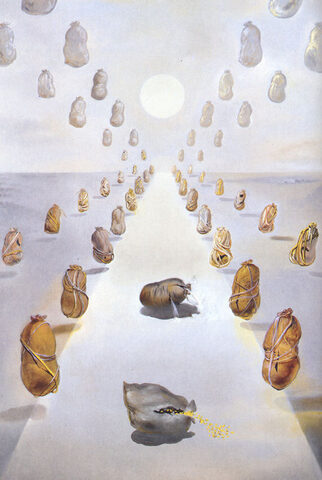

Peintre : Salvador Dali


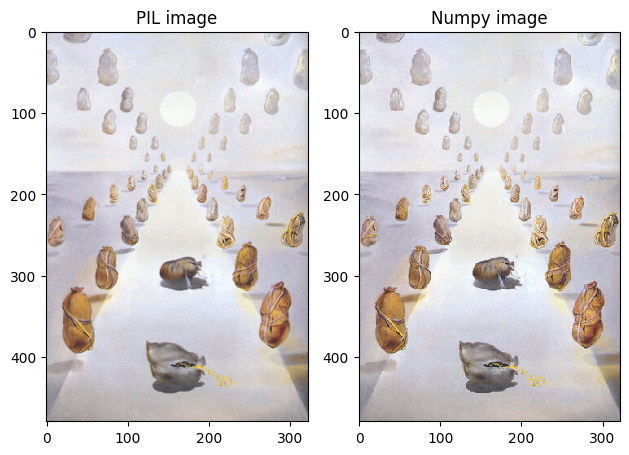

In [9]:
from tensorflow.keras.utils import load_img, img_to_array

random_index = rd.randint(0,len(df)-1)
filename = df['filename'][random_index]
label = df['label'][random_index]

img = load_img(path_images_lq + filename)

display(img)

plt.subplot(1,2,1)
plt.imshow(img)
plt.title("PIL image")

plt.subplot(1,2,2)
x = img_to_array(img)
plt.imshow(x/255, interpolation='nearest')
plt.title("Numpy image")

print('Peintre :', label)

plt.tight_layout()
plt.show()

Nous séparons notre jeu de données en 3 ensembles :
- Train : qui va nous servir à entrainer nos modèles
- Validation : afin de valider l'entrainement de nos modèles
- Test : pour tester les résultats de nos modèles

Le train set représente 70% de notre jeu de données, le validation et le test set en représentent chacun 15%. Aussi, nous avons utilisé l'argument stratify='df["label"]' afin de s'assurer que les artistes soient représentés dans des proportions cohérantes dans chaque ensemble.

In [10]:
from sklearn.model_selection import train_test_split

df_train, df_val_and_test = train_test_split(df, test_size=0.3, stratify=df["label"], random_state=42)
df_validation, df_test = train_test_split(df_val_and_test, test_size=0.5, stratify=df_val_and_test["label"], random_state=42)

N_train = len(df_train)
N_validation = len(df_validation)
N_test = len(df_test)

On affiche aussi le nombre de peintures par artistes. On remarque que Van Gogh est l'artiste le plus représente dans le jeu de données avec plus de 800 oeuvres, tandis que les artistes les moins représentés sont autour des 20 oeuvres. On réalise cet affichage en termes de fréquence, pour se rendre compte que Van Gogh représente à lui tout seul 10% du jeu de données.

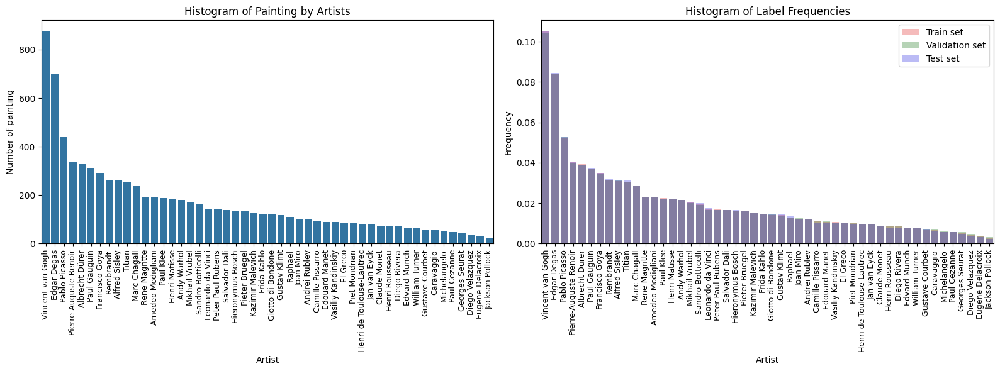

In [11]:
import seaborn as sns

label_counts = df["label"].value_counts(normalize=False)

label_counts_train = df_train["label"].value_counts(normalize=True)
label_counts_val = df_validation["label"].value_counts(normalize=True)
label_counts_test = df_test["label"].value_counts(normalize=True)

# Plot the histogram
plt.figure(figsize=(16, 6))

plt.subplot(121)
sns.barplot(x=label_counts.index, y=label_counts.values)
plt.xlabel('Artist')
plt.ylabel('Number of painting')
plt.title('Histogram of Painting by Artists')
plt.xticks(rotation=90, size=9)

plt.subplot(122)
sns.barplot(x=label_counts_train.index, y=label_counts_train.values,alpha=0.3,label='Train set',color='red')
sns.barplot(x=label_counts_val.index, y=label_counts_val.values,alpha=0.3,label='Validation set',color='green')
sns.barplot(x=label_counts_test.index, y=label_counts_test.values,alpha=0.3,label='Test set',color='blue')
plt.xlabel('Artist')
plt.ylabel('Frequency')
plt.title('Histogram of Label Frequencies')
plt.xticks(rotation=90, size=9)
plt.legend()

plt.tight_layout()
# Show the plot
plt.show()

Les images considérées représentent des tableaux, et sont naturellement de taille différente. En ce sens, nous affichons les boxplot des hauteurs et largeurs des tableaux, et nous redimensionnons toutes les images à des tailles de 256*256 pixels. Nous en profitons pour générer les 'generator' relatifs au train, validation et test, qui nous seront utiles lors de la phase d'apprentissage. 

In [12]:
heights = np.zeros(N_train)
widths = np.zeros(N_train)

for i, filename in enumerate(df_train['filename']):
    image = load_img(path_images_lq + filename)
    heights[i], widths[i] = img_to_array(image).shape[:2]

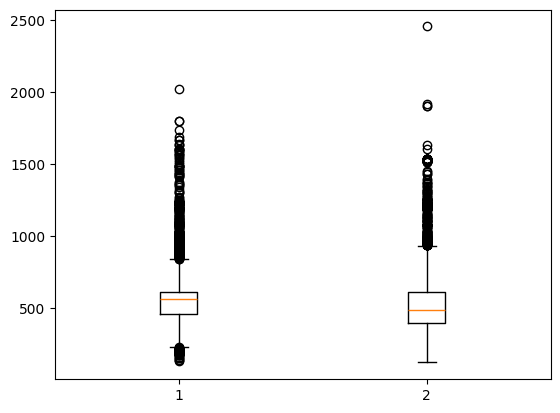

In [13]:
plt.figure()
plt.boxplot([heights,widths])
plt.show()

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [15]:
batch_size = 20  # divider of N_train and N_validation
img_width = 256
img_height = 256

# Training images
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    target_size = (img_width, img_height),
    class_mode = 'categorical',
    batch_size = batch_size,
    shuffle=False
)

# Validation images  
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    df_validation,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    class_mode = 'categorical',
    target_size = (img_width, img_height),
    batch_size = batch_size,
    shuffle=False
)

# Test images
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_test,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    class_mode = 'categorical',
    target_size = (img_width, img_height),
    batch_size = batch_size,
    shuffle=False
)

Found 5848 validated image filenames belonging to 50 classes.
Found 1253 validated image filenames belonging to 50 classes.
Found 1254 validated image filenames belonging to 50 classes.


In [16]:
artists = pd.read_csv("artists.csv")[["name"]].sort_values(by="name").reset_index(drop=True).to_dict()['name']

On affiche aléatoirement 9 de nos images de train, afin entres autres de vérifier que nos images sont bien redimensionnées, sans perte d'information.

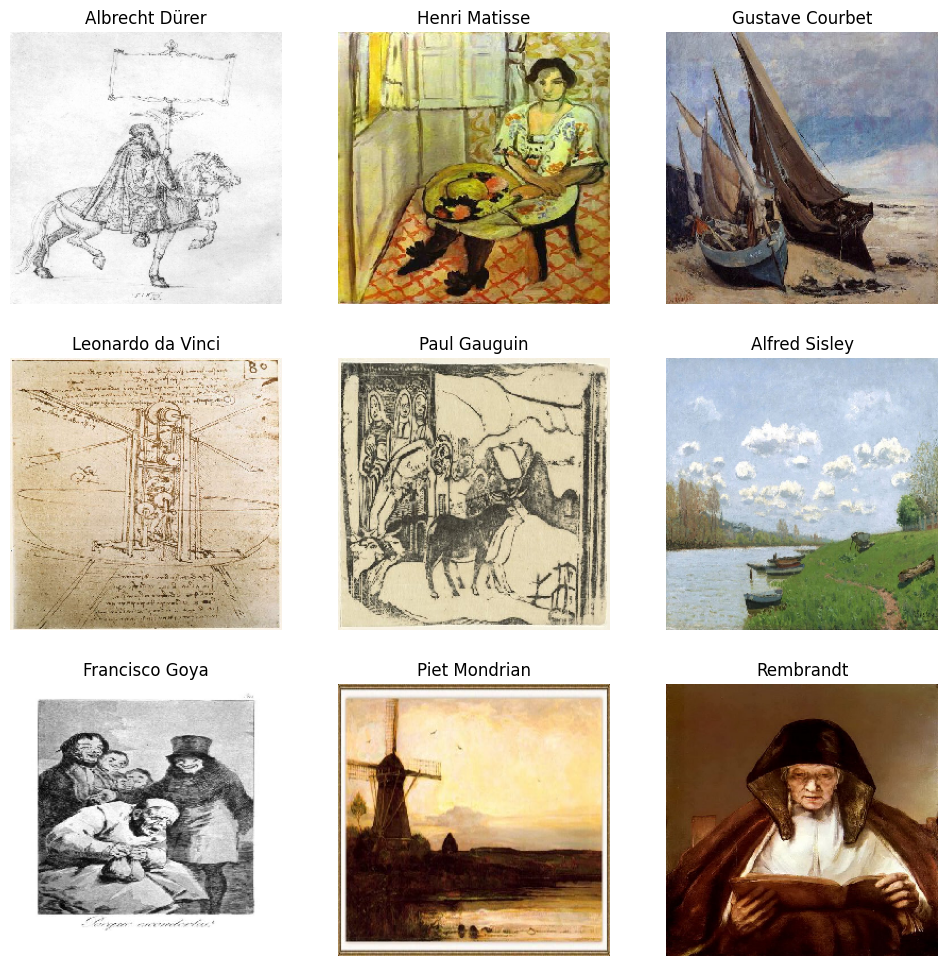

In [17]:
plt.figure(figsize=(12, 12))

for i in range(0,9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in train_generator:
        plt.imshow(x_batch[0])
        plt.title(labels[np.argmax(y_batch)])
        plt.axis('off')
        plt.grid(False)
        break
        
plt.show()

# Première approche : CNN simple sur tout le dataset

## Architecture du modèle

Notre première idée est de réaliser un CNN le plus simple possible, composé de 3 couches de convolution - MaxPooling, puis d'un réseau dense composé d'une couche cachée de 64 neuronnes, puis d'une couche de sortie de taille 50. Cette architecture est basique mais nous permet de prendre en main les données, et de prendre conscience de l'ordre de grandeur des résultats obtenables.

In [18]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam


cnn_simple = Sequential()

cnn_simple.add(Input(shape=(img_width,img_height,3)))

cnn_simple.add(Conv2D(32, (3,3), activation='relu'))
cnn_simple.add(MaxPooling2D(pool_size=(2,2)))

cnn_simple.add(Conv2D(64, (3,3), activation='relu'))
cnn_simple.add(MaxPooling2D(pool_size=(2,2)))

cnn_simple.add(Conv2D(96, (3,3), activation='relu'))
cnn_simple.add(MaxPooling2D(pool_size=(2,2)))


cnn_simple.add(Flatten())


cnn_simple.add(Dense(64, activation='relu'))
cnn_simple.add(Dropout(0.5))
cnn_simple.add(Dense(50, activation='softmax'))

cnn_simple.summary()

2024-12-20 16:52:01.573282: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10269 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:65:00.0, compute capability: 6.1


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     5,529,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         3,250 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,607,698 (21.39 MB)

 Trainable params: 5,607,698 (21.39 MB)

 Non-trainable params: 0 (0.00 B)

## Entrainement du modèle

On entraine ensuite le modèle sur 15 epochs, en prenant comme loss la categorical crossentropy, et comme metrique l'accuracy.  

In [19]:
train_cnn_simple = False

In [20]:
epochs = 15

cnn_simple.compile(
    loss = 'categorical_crossentropy',#weighted_categorical_crossentropy(weights), #'categorical_crossentropy'
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']) #'f1_score'

if train_cnn_simple :
    
    t_learning_cnn_simple = time.time()
    cnn_simple_history = cnn_simple.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs
    )
    t_learning_cnn_simple = time.time() - t_learning_cnn_simple
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_cnn_simple))

    cnn_simple.save("model_weights/cnn_simple.keras")

    with open("model_weights/cnn_simple_history.pkl", "wb") as f:
        pickle.dump(cnn_simple_history, f)

else :
    
    # Load the previously saved weights
    """
    cnn_simple.compile(
        loss = 'categorical_crossentropy',#weighted_categorical_crossentropy(weights), #'categorical_crossentropy'
        optimizer = Adam(learning_rate=1e-3),
        metrics = ['accuracy']) #'f1_score'"""

    with open("model_weights/cnn_simple_history.pkl", "rb") as f:
        cnn_simple_history = pickle.load(f)
    
    cnn_simple.load_weights("model_weights/cnn_simple.keras") 

In [21]:
t_prediction_cnn_simple = time.time()

score_cnn_train = cnn_simple.evaluate(train_generator, verbose=1)
score_cnn_test = cnn_simple.evaluate(test_generator, verbose=1)
score_cnn_validation = cnn_simple.evaluate(validation_generator, verbose=1)

t_prediction_cnn_simple = time.time() - t_prediction_cnn_simple

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_cnn_simple )

I0000 00:00:1734709928.105127    4191 service.cc:146] XLA service 0x76cb8c005ef0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734709928.105183    4191 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2024-12-20 16:52:08.353454: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-20 16:52:08.862856: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


  3/293 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - accuracy: 0.5861 - loss: 1.4506

I0000 00:00:1734709934.236742    4191 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


293/293 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - accuracy: 0.5991 - loss: 1.3249
63/63 ━━━━━━━━━━━━━━━━━━━━ 15s 246ms/step - accuracy: 0.2514 - loss: 3.3917
63/63 ━━━━━━━━━━━━━━━━━━━━ 15s 241ms/step - accuracy: 0.2519 - loss: 3.3270
Train accuracy: 0.5967852473258972
Test accuracy: 0.25438597798347473
Validation accuracy: 0.25219473242759705
Time Prediction: 65.20 seconds


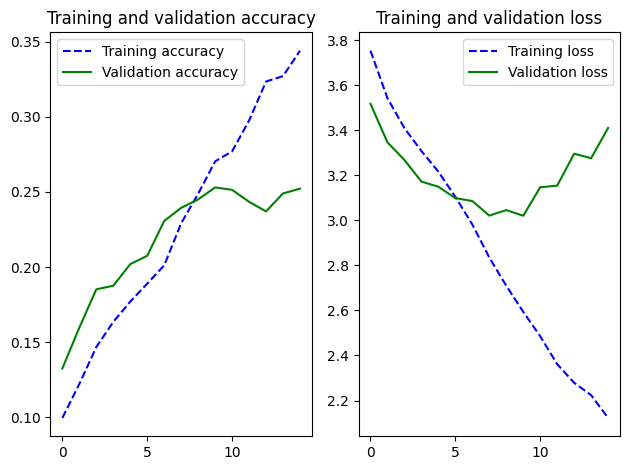

In [22]:
def plot_training_analysis(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.subplot(1,2,1)
    plt.plot(epochs, acc, 'b', linestyle="--",label='Training accuracy')
    plt.plot(epochs, val_acc, 'g', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(epochs, loss, 'b', linestyle="--",label='Training loss')
    plt.plot(epochs, val_loss,'g', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_analysis(cnn_simple_history)

On se rend compte qu'après 15 epochs, le modèle est déjà overfitté. En effet, la training loss continue de descendre tandis que la validation loss remonte. Cela signifie que l'on apprend de plus en plus à répondre au training set, sans pour autant savoir généraliser à de nouveaux tableaux. Aussi, on est de l'ordre de 60% d'accuracy sur le training set, tandis qu'on est à 25% sur le test set. 

In [23]:
test_prediction = cnn_simple.predict(test_generator)

63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step


La fonction ci-après nous permet d'afficher les prédictions de notre modèle sur l'ensemble de test. Elle affiche en vert les bonnes prédictions. On se rend compte que notre modèle à appris un biais : il a tendance à facilement prédir des artistes sur-représentés dans le jeu de données (comme Van Gogh, Degas ou Picasso). Cela s'explique car, même en répondant aléatoirement, le modèle se trompera moins si il prédit souvent les artistes qu'il a beaucoup vu. 

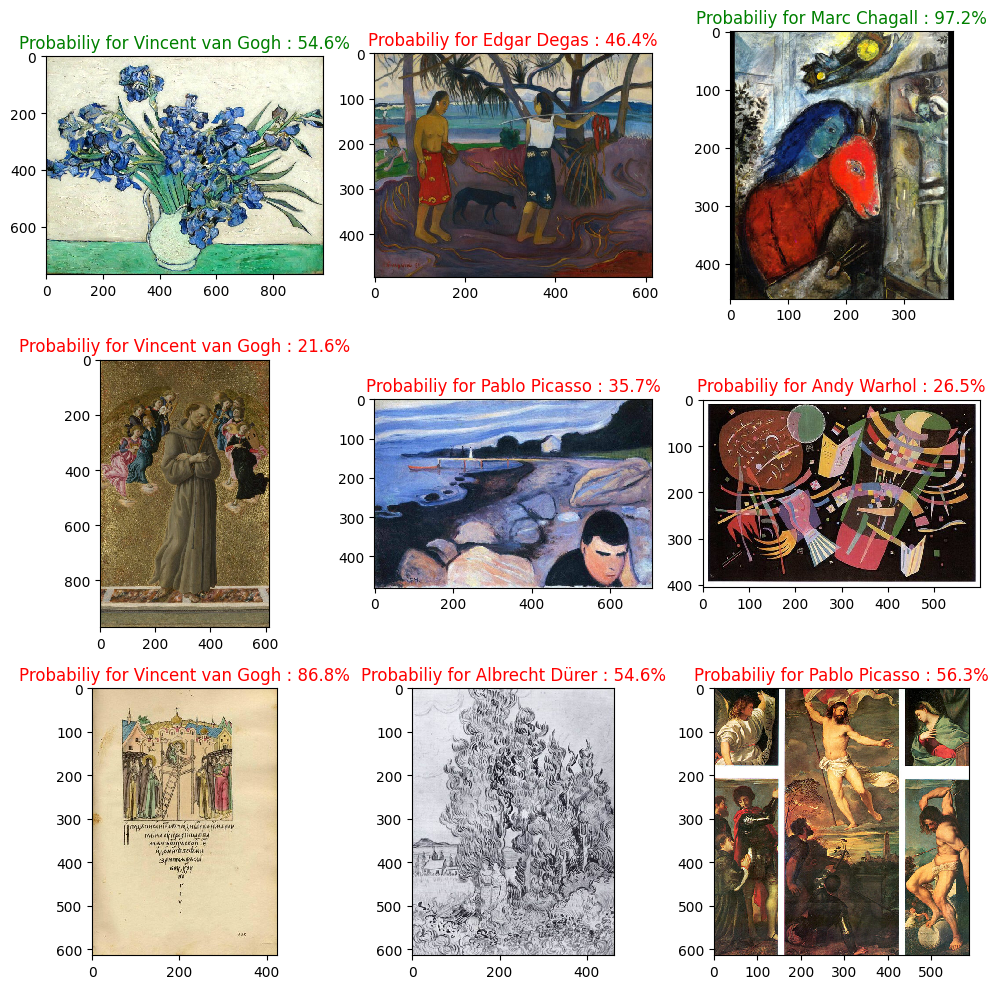

In [24]:
def guess_artist(test_prediction) :
    
    fig = plt.figure(figsize=(10,10))
    
    test_imgs_idx = np.random.randint(low=0, high=df_test.shape[0] - 1, size=(9,))
    
    for i, idx in enumerate(test_imgs_idx):
        img = img_to_array(load_img(path_images_lq + df_test['filename'].iloc[idx]) )/255
        
        artist_pred = np.argmax(test_prediction[idx])
        pourcent_pred = np.max(test_prediction[idx])
        
        ax = fig.add_subplot(3,3,i+1)
        ax.imshow(img, interpolation='nearest')
        color = "green"
        title = "Probabiliy for " +  artists[artist_pred] + " : %.1f" % (pourcent_pred*100) + "%"
        if df_test['label'].iloc[idx] != artists[artist_pred]:
            color = "red"
    
        ax.set_title(title, color=color)
    
    plt.tight_layout()
    plt.show()

guess_artist(test_prediction)

# Deuxieme approche : Considérer une loss pondérée en fonction du nombre de tableaux

Le phénomène comme quoi le réseau prédit majoritairement les artistes les plus présents dans le dataset nous pose problème. En effet, nous ne trouvons pas concevable que l'artiste prédit dépende fortement du fait que l'artiste ait peind beaucoup d'oeuvres ou non. Pour rémédier à cela, nous avons imaginé une nouvelle fonction de perte, une categorical crossentropy pondérée par le nombre de tableaux par artistes. Ainsi, nous espérons que pour un grand nombre de prédictions, le réseau apprenne à reconnaître les artistes, et ne prédise pas aléatoirement des artistes très présents dans le dataset.

In [25]:
from keras.saving import register_keras_serializable

def weighted_categorical_crossentropy(weights):
    """
    Crée une fonction de perte categorical_crossentropy pondérée.

    :param weights: Un vecteur de poids pour chaque classe.
    :return: Une fonction de perte personnalisée.
    """
    weights = tf.constant(weights, dtype=tf.float32)

    @register_keras_serializable()
    def loss(y_true, y_pred):
        # Calculer la perte de categorical crossentropy
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        cce = -tf.reduce_sum(y_true * tf.math.log(y_pred), axis=-1)
        
        # Appliquer les poids
        weighted_cce = cce * tf.reduce_sum(weights * y_true, axis=-1)
        
        return tf.reduce_mean(weighted_cce)

    return loss

In [26]:
#Les poids valent l'inverse du nombre d'occurence de l'artiste associé
weights = [len(df["label"]) / df[df["label"]==artist]["label"].count() for artist in artists.values()]

L'architecture du modèle reste inchangée.

In [27]:
cnn_weighted = Sequential()
cnn_weighted.add(Input(shape=(img_width,img_height,3)))

cnn_weighted.add(Conv2D(32, (3,3), activation='relu'))
cnn_weighted.add(MaxPooling2D(pool_size=(2,2)))

cnn_weighted.add(Conv2D(64, (3,3), activation='relu'))
cnn_weighted.add(MaxPooling2D(pool_size=(2,2)))

cnn_weighted.add(Conv2D(96, (3,3), activation='relu'))
cnn_weighted.add(MaxPooling2D(pool_size=(2,2)))

#cnn_weighted.add(Conv2D(128, (3,3), activation='relu'))
#cnn_weighted.add(MaxPooling2D(pool_size=(2,2)))


cnn_weighted.add(Flatten())

# cnn_weighted.add(Dense(512, activation='relu'))
cnn_weighted.add(Dense(64, activation='relu'))
cnn_weighted.add(Dropout(0.3))
cnn_weighted.add(Dense(50, activation='softmax'))


cnn_weighted.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 60, 60, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 30, 30, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │     5,529,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 50)             │         3,250 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,607,698 (21.39 MB)

 Trainable params: 5,607,698 (21.39 MB)

 Non-trainable params: 0 (0.00 B)

In [28]:
train_cnn_weighted = False

In [29]:
epochs = 15

cnn_weighted.compile(
    loss = weighted_categorical_crossentropy(weights),#weighted_categorical_crossentropy(weights), #'categorical_crossentropy'
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']) #'f1_score'

if train_cnn_weighted :
    
    t_learning_cnn_weighted = time.time()
    cnn_weighted_history = cnn_weighted.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs
    )
    
    t_learning_cnn_weighted = time.time() - t_learning_cnn_weighted
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_cnn_weighted))

    cnn_weighted.save("model_weights/cnn_weighted.keras")

    with open("model_weights/cnn_weighted_history.pkl", "wb") as f:
        pickle.dump(cnn_weighted_history, f)

else :
    # Load the previously saved weights
    cnn_weighted.load_weights("model_weights/cnn_weighted.keras")

    with open("model_weights/cnn_weighted_history.pkl", "rb") as f:
        cnn_weighted_history = pickle.load(f)

In [30]:
t_prediction_cnn_weighted = time.time()

score_cnn_train = cnn_weighted.evaluate(train_generator, verbose=1)
score_cnn_test = cnn_weighted.evaluate(test_generator, verbose=1)
score_cnn_validation = cnn_weighted.evaluate(validation_generator, verbose=1)

t_prediction_cnn_weighted = time.time() - t_prediction_cnn_weighted

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_cnn_weighted )

293/293 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.9510 - loss: 6.6069
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.1785 - loss: 362.2274
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.1949 - loss: 382.3926
Train accuracy: 0.9471614360809326
Test accuracy: 0.18102073669433594
Validation accuracy: 0.19074222445487976
Time Prediction: 38.31 seconds


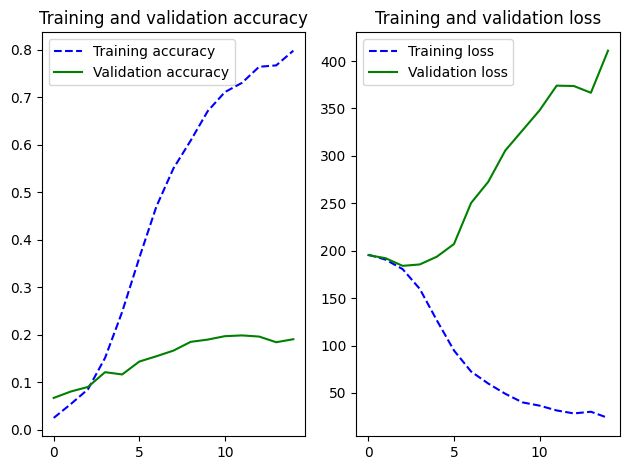

In [31]:
plot_training_analysis(cnn_weighted_history)

Après 15 epochs, les résultats sont très peu satisfaisant. Le modèle n'a pas appris sur le validation set et a overfitté le training set. Cependant, l'idée de la loss pondérée nous parraît justifiée et pertinente. Par exemple, nous pouvons observer ci-après que le modèle ne prédit plus uniquement les artistes les plus présents.

In [32]:
test_prediction = cnn_weighted.predict(test_generator)

63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step


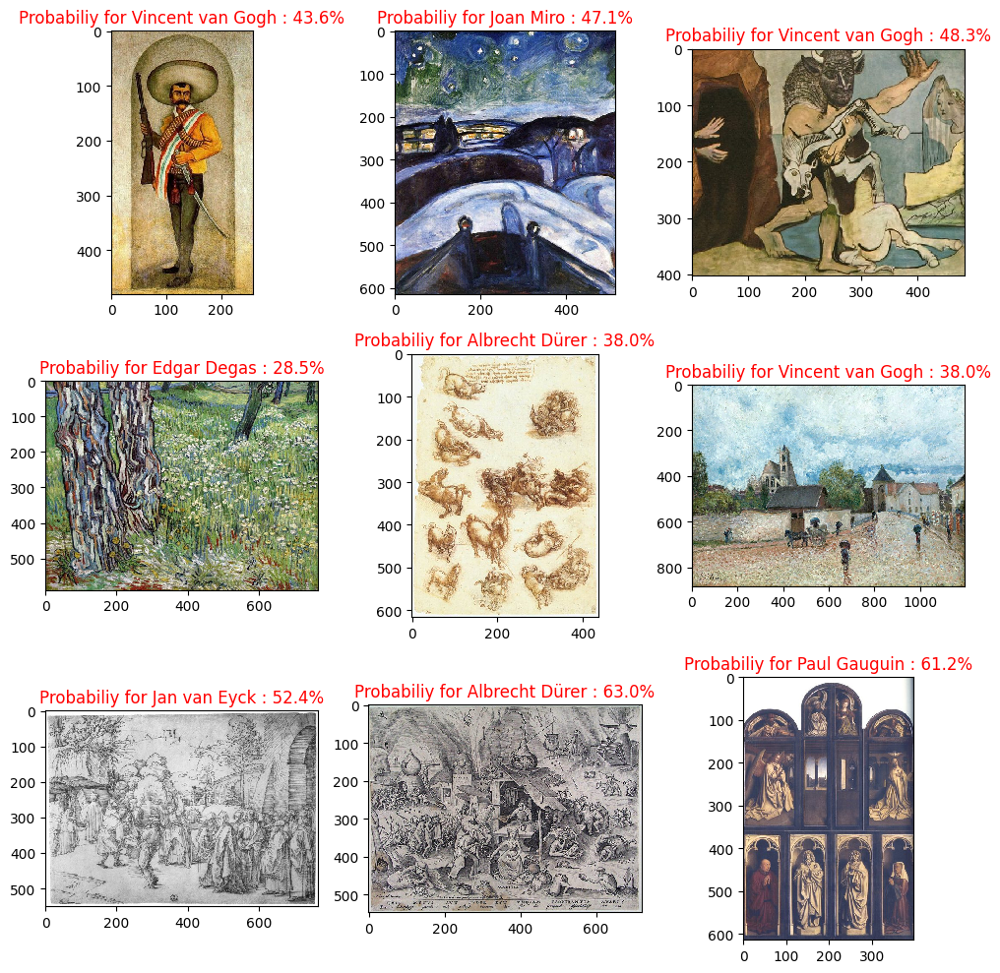

In [33]:
guess_artist(test_prediction)

# Troisième approche : Reduction du dataset

Une autre raison de nos mauvaises prédictions est le fait que notre modèle doit prédire entre 50 artistes, ce qui fait un nombre de possibilité très important pour chaque tableaux, alors qu'il n'a été entrainé que sur une dizaine de tableaux pour certains artistes. Ainsi, nous decidons de réduire le jeu de données en enlevant des artistes. Pour cela, nous nous fixons le seuil d'enlever au maximum 25% des tableaux du dataset, et nous calculons le nombre d'artistes maximum que nous pouvons retirer en conservant les trois quarts de nos données. En faisant cela, nous trouvons que l'on peut enlever les 27 artistes les moins représentés afin de conserver 75% de notre jeu de données. Nous nous retrouvons donc avec 23 artistes restants.

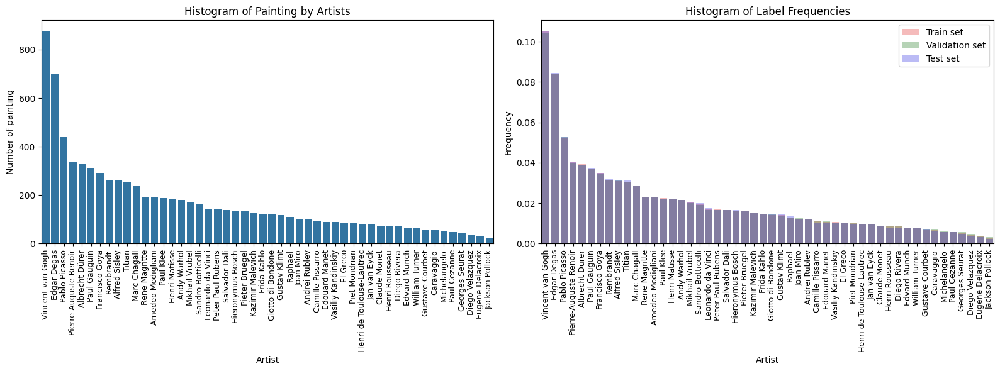

In [34]:
import seaborn as sns

label_counts = df["label"].value_counts(normalize=False)

label_counts_train = df_train["label"].value_counts(normalize=True)
label_counts_val = df_validation["label"].value_counts(normalize=True)
label_counts_test = df_test["label"].value_counts(normalize=True)

# Plot the histogram
plt.figure(figsize=(16, 6))

plt.subplot(121)
sns.barplot(x=label_counts.index, y=label_counts.values)
plt.xlabel('Artist')
plt.ylabel('Number of painting')
plt.title('Histogram of Painting by Artists')
plt.xticks(rotation=90, size=9)

#plt.hlines(np.quantile(label_counts, 0.75), 0, 50, color='red', label='threshhold')
#plt.legend()

plt.subplot(122)
sns.barplot(x=label_counts_train.index, y=label_counts_train.values,alpha=0.3,label='Train set',color='red')
sns.barplot(x=label_counts_val.index, y=label_counts_val.values,alpha=0.3,label='Validation set',color='green')
sns.barplot(x=label_counts_test.index, y=label_counts_test.values,alpha=0.3,label='Test set',color='blue')
plt.xlabel('Artist')
plt.ylabel('Frequency')
plt.title('Histogram of Label Frequencies')
plt.xticks(rotation=90, size=9)
plt.legend()

plt.tight_layout()
# Show the plot
plt.show()

In [35]:
# Compte le nombre de tableaux par artiste
label_counts = df["label"].value_counts(normalize=False)

label_counts = label_counts.sort_values(ascending = True)

# Nombre total de tableaux dans le dataset
total_paintings = label_counts.sum()
print(total_paintings)

# Calcul de la limite de tableaux à supprimer (10 % du total)
limit = 0.25 * total_paintings
print(limit)

# Initialise des variables pour suivre la suppression
removed_paintings = 0
artists_to_remove = []

# Parcours des artistes par ordre décroissant de tableaux
for artist, count in label_counts.items():
    if removed_paintings + count <= limit:
        removed_paintings += count
        artists_to_remove.append(artist)
    else:
        break  # Arrête si on atteint la limite de 10 %

# Affiche les artistes sélectionnés pour suppression
print("Artistes à retirer :", artists_to_remove)
print("Tableaux retirés :", removed_paintings)
print("Pourcentage des tableaux retirés :", removed_paintings / total_paintings * 100, "%")

# Filtrer le DataFrame pour enlever les artistes sélectionnés
df_filtered = df[~df["label"].isin(artists_to_remove)]

8355
2088.75
Artistes à retirer : ['Jackson Pollock', 'Eugene Delacroix', 'Diego Velazquez', 'Georges Seurat', 'Paul Cezanne', 'Michelangelo', 'Caravaggio', 'Gustave Courbet', 'William Turner', 'Edvard Munch', 'Henri Rousseau', 'Diego Rivera', 'Claude Monet', 'Henri de Toulouse-Lautrec', 'Jan van Eyck', 'Piet Mondrian', 'El Greco', 'Vasiliy Kandinskiy', 'Edouard Manet', 'Camille Pissarro', 'Andrei Rublev', 'Joan Miro', 'Raphael', 'Gustav Klimt', 'Giotto di Bondone', 'Frida Kahlo', 'Kazimir Malevich']
Tableaux retirés : 2085
Pourcentage des tableaux retirés : 24.95511669658887 %


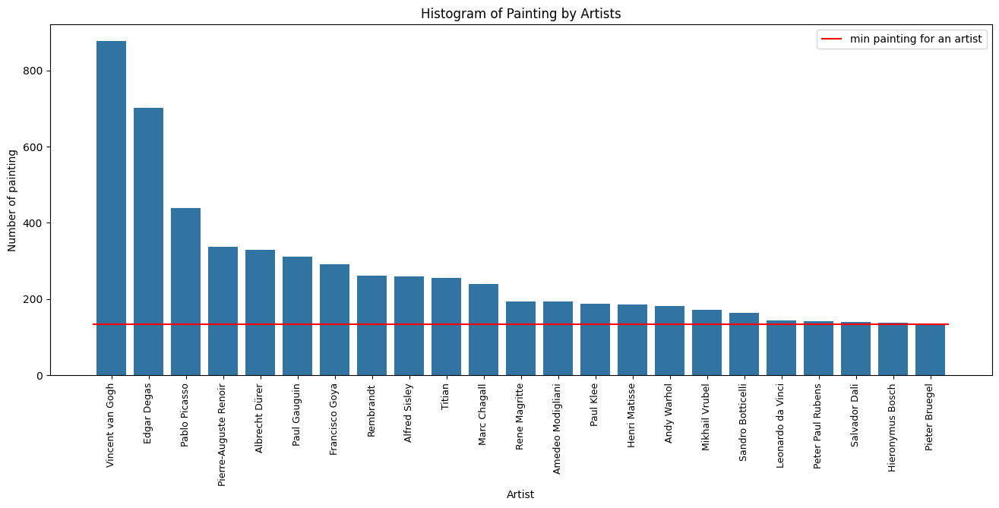

In [36]:
import seaborn as sns

label_counts_filtered = df_filtered["label"].value_counts(normalize=False)

# Plot the histogram
plt.figure(figsize=(16, 6))

sns.barplot(x=label_counts_filtered.index, y=label_counts_filtered.values)
plt.xlabel('Artist')
plt.ylabel('Number of painting')
plt.title('Histogram of Painting by Artists')
plt.xticks(rotation=90, size=9)

plt.hlines(np.min(label_counts_filtered), -0.5, len(label_counts_filtered)-0.5, color='red', label='min painting for an artist')
plt.legend()

# Show the plot
plt.show()

In [37]:
df_train, df_val_and_test = train_test_split(df_filtered, test_size=0.3, stratify=df_filtered["label"], random_state=42) #stratify est OP
df_validation, df_test = train_test_split(df_val_and_test, test_size=0.5, stratify=df_val_and_test["label"], random_state=42)

N_train = len(df_train)
N_validation = len(df_validation)
N_test = len(df_test)

print(N_train,N_validation,N_test)

4389 940 941


In [38]:
# Training images
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    target_size = (img_width, img_height),
    class_mode = 'categorical',
    batch_size = batch_size,
    shuffle=False
)

# Validation images  
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    df_validation,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    class_mode = 'categorical',
    target_size = (img_width, img_height),
    batch_size = batch_size,
    shuffle=False
)

# Test images
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_test,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    class_mode = 'categorical',
    target_size = (img_width, img_height),
    batch_size = batch_size,
    shuffle=False
)

Found 4389 validated image filenames belonging to 23 classes.
Found 940 validated image filenames belonging to 23 classes.
Found 941 validated image filenames belonging to 23 classes.


L'architecture du modèle reste la même, seules les données ont changé.

In [39]:
cnn_filtered = Sequential()
cnn_filtered.add(Input(shape=(img_width,img_height,3)))

cnn_filtered.add(Conv2D(32, (3,3), activation='relu'))
cnn_filtered.add(MaxPooling2D(pool_size=(2,2)))

cnn_filtered.add(Conv2D(64, (3,3), activation='relu'))
cnn_filtered.add(MaxPooling2D(pool_size=(2,2)))

cnn_filtered.add(Conv2D(96, (3,3), activation='relu'))
cnn_filtered.add(MaxPooling2D(pool_size=(2,2)))

#cnn_simple.add(Conv2D(128, (3,3), activation='relu'))
#cnn_simple.add(MaxPooling2D(pool_size=(2,2)))


cnn_filtered.add(Flatten())

# cnn_simple.add(Dense(512, activation='relu'))
cnn_filtered.add(Dense(64, activation='relu'))
cnn_filtered.add(Dropout(0.5))
cnn_filtered.add(Dense(len(label_counts_filtered), activation='softmax'))

cnn_filtered.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 60, 60, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 30, 30, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 86400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │     5,529,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 23)             │         1,495 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,605,943 (21.38 MB)

 Trainable params: 5,605,943 (21.38 MB)

 Non-trainable params: 0 (0.00 B)

In [40]:
train_cnn_filtered = False

epochs = 15

cnn_filtered.compile(
    loss = 'categorical_crossentropy',#weighted_categorical_crossentropy(weights), #'categorical_crossentropy'
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']) #'f1_score'

if train_cnn_filtered :

    t_learning_cnn_filtered = time.time()
    cnn_filtered_history = cnn_filtered.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs
    )
    t_learning_cnn_filtered = time.time() - t_learning_cnn_filtered
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_cnn_filtered))

    cnn_filtered.save("model_weights/cnn_filtered.keras")
    
    with open("model_weights/cnn_filtered_history.pkl", "wb") as f:
        pickle.dump(cnn_filtered_history, f)
        
else :
    # Load the previously saved weights
    cnn_filtered.load_weights("model_weights/cnn_filtered.keras")

    with open("model_weights/cnn_filtered_history.pkl", "rb") as f:
        cnn_filtered_history = pickle.load(f)
    
    #cnn_filtered.load("model_weights/cnn_filtered.keras")

In [41]:
t_prediction_cnn_filtered = time.time()

score_cnn_train = cnn_filtered.evaluate(train_generator, verbose=1)
score_cnn_test = cnn_filtered.evaluate(test_generator, verbose=1)
score_cnn_validation = cnn_filtered.evaluate(validation_generator, verbose=1)

t_prediction_cnn_filtered = time.time() - t_prediction_cnn_filtered

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_cnn_filtered )

220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - accuracy: 0.9175 - loss: 0.3581
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.3937 - loss: 2.4479
47/47 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.4261 - loss: 2.4229
Train accuracy: 0.9138755798339844
Test accuracy: 0.4038257300853729
Validation accuracy: 0.3851063847541809
Time Prediction: 29.41 seconds


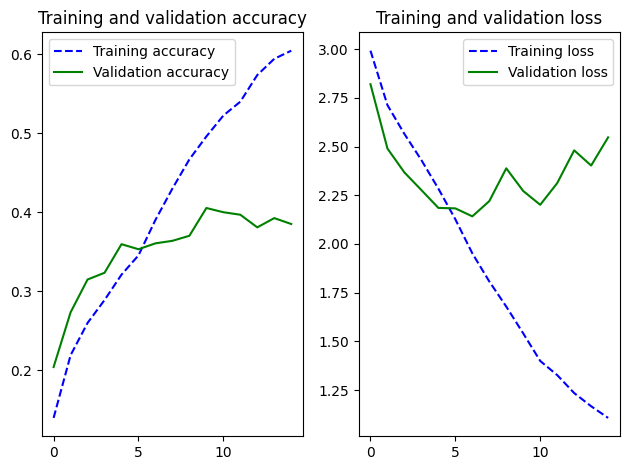

In [42]:
plot_training_analysis(cnn_filtered_history)

In [43]:
test_prediction = cnn_filtered.predict(test_generator)

48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step


In [44]:
#Redéfinition de 'artists' pour prendre en compte les tableaux supprimés
artists = df_filtered["label"].unique()#
print(artists)

['Albrecht Dürer' 'Alfred Sisley' 'Amedeo Modigliani' 'Andy Warhol'
 'Edgar Degas' 'Francisco Goya' 'Henri Matisse' 'Hieronymus Bosch'
 'Leonardo da Vinci' 'Marc Chagall' 'Mikhail Vrubel' 'Pablo Picasso'
 'Paul Gauguin' 'Paul Klee' 'Peter Paul Rubens' 'Pierre-Auguste Renoir'
 'Pieter Bruegel' 'Rembrandt' 'Rene Magritte' 'Salvador Dali'
 'Sandro Botticelli' 'Titian' 'Vincent van Gogh']


In [45]:
test_prediction.shape

(941, 23)

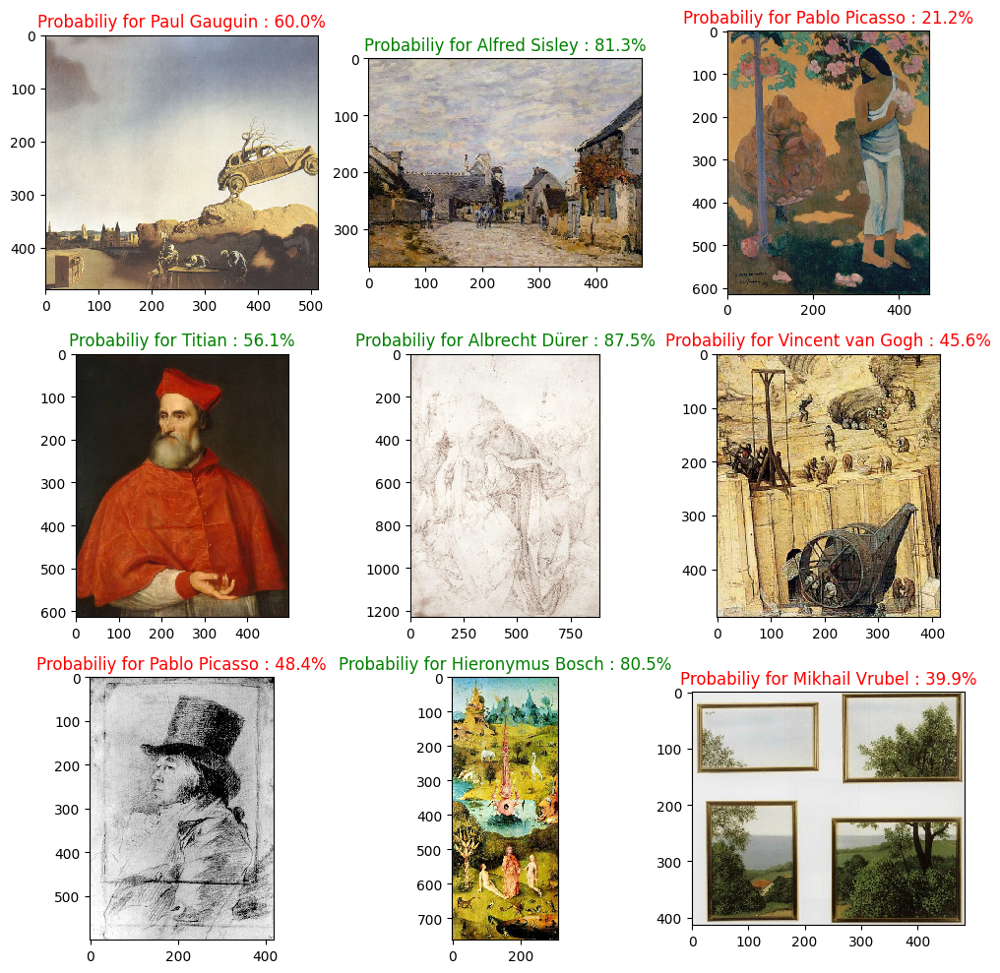

In [46]:
guess_artist(test_prediction)

Nous pouvons remarquer que, d'une part, l'accuracy du modèle à augmenté. Cela s'explique facilement car pour chaque tableau, il a moins de possibilités de prédictions. Cependant, le modèle est toujours overfitté. Aussi, on peut remarquer qu'en réintroduisant une fonction de perte "classique", le modèle se remet à prédir majorirairement les artistes très présents dans le jeu de donées.

# Quatrième approche : on limite le nombre de tableaux par artistes

Lors de la troisième approche, le phénomène selon lequel le modèle prédit majoritairement des artistes très présents dans le dataset a encore été observé. Afin de résoudre ce problème, sans avoir à modifier la fonction de perte (nous avons vu dans la partie 2 que cela était peu efficace) est de restreindre le nombre de tableaux présents dans le jeu de données pour les artistes très prolifiques. Pour cela, nous seuillons le nombre de tableaux de nos 23 artistes au nomnre de tableaux de l'artiste le moins productif.

In [47]:
min_paintings = np.min(label_counts_filtered)
balanced_df = pd.DataFrame()

# Pour chaque artiste, échantillonne aléatoirement le nombre minimum de tableaux
for artist in label_counts_filtered.index:
    artist_paintings = df_filtered[df_filtered["label"] == artist]
    sampled_paintings = artist_paintings.sample(n=min_paintings, random_state=42)
    balanced_df = pd.concat([balanced_df, sampled_paintings])

# Réinitialise les index pour un DataFrame propre
balanced_df = balanced_df.reset_index(drop=True)

label_counts_balanced = balanced_df["label"].value_counts(normalize=False)

# Affiche le DataFrame équilibré
print(balanced_df)
print("Nombre de tableaux par artiste :", balanced_df["label"].value_counts())

                      filename             label
0     Vincent_van_Gogh_739.jpg  Vincent van Gogh
1     Vincent_van_Gogh_760.jpg  Vincent van Gogh
2     Vincent_van_Gogh_319.jpg  Vincent van Gogh
3     Vincent_van_Gogh_307.jpg  Vincent van Gogh
4     Vincent_van_Gogh_361.jpg  Vincent van Gogh
...                        ...               ...
3077     Pieter_Bruegel_42.jpg    Pieter Bruegel
3078     Pieter_Bruegel_74.jpg    Pieter Bruegel
3079    Pieter_Bruegel_111.jpg    Pieter Bruegel
3080     Pieter_Bruegel_61.jpg    Pieter Bruegel
3081     Pieter_Bruegel_70.jpg    Pieter Bruegel

[3082 rows x 2 columns]
Nombre de tableaux par artiste : label
Vincent van Gogh         134
Edgar Degas              134
Pablo Picasso            134
Pierre-Auguste Renoir    134
Albrecht Dürer           134
Paul Gauguin             134
Francisco Goya           134
Rembrandt                134
Alfred Sisley            134
Titian                   134
Marc Chagall             134
Rene Magritte            134


In [48]:
df_train, df_val_and_test = train_test_split(balanced_df, test_size=0.3, stratify=balanced_df["label"], random_state=42) #stratify est OP
df_validation, df_test = train_test_split(df_val_and_test, test_size=0.5, stratify=df_val_and_test["label"], random_state=42)

N_train = len(df_train)
N_validation = len(df_validation)
N_test = len(df_test)

print(N_train,N_validation,N_test)

2157 462 463


In [49]:
# Training images
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    target_size = (img_width, img_height),
    class_mode = 'categorical',
    batch_size = batch_size,
    shuffle=True
)

# Validation images  
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    df_validation,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    class_mode = 'categorical',
    target_size = (img_width, img_height),
    batch_size = batch_size,
    shuffle=False
)

# Test images
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_test,
    path_images_lq,
    x_col = 'filename',
    y_col = 'label',
    class_mode = 'categorical',
    target_size = (img_width, img_height),
    batch_size = batch_size,
    shuffle=False
)

Found 2157 validated image filenames belonging to 23 classes.
Found 462 validated image filenames belonging to 23 classes.
Found 463 validated image filenames belonging to 23 classes.


In [50]:
cnn_balanced = Sequential()
cnn_balanced.add(Input(shape=(img_width,img_height,3)))

cnn_balanced.add(Conv2D(32, (3,3), activation='relu'))
cnn_balanced.add(MaxPooling2D(pool_size=(2,2)))

cnn_balanced.add(Conv2D(64, (3,3), activation='relu'))
cnn_balanced.add(MaxPooling2D(pool_size=(2,2)))

cnn_balanced.add(Conv2D(128, (3,3), activation='relu'))
cnn_balanced.add(MaxPooling2D(pool_size=(2,2)))

cnn_balanced.add(Conv2D(256, (3,3), activation='relu'))
cnn_balanced.add(MaxPooling2D(pool_size=(2,2)))


cnn_balanced.add(Flatten())

cnn_balanced.add(Dense(256, activation='relu'))
cnn_balanced.add(Dropout(0.3))
cnn_balanced.add(Dense(128, activation='relu'))
cnn_balanced.add(Dropout(0.3))
cnn_balanced.add(Dense(len(label_counts_balanced), activation='softmax'))

cnn_balanced.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 23)             │         2,967 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,269,591 (50.62 MB)

 Trainable params: 13,269,591 (50.62 MB)

 Non-trainable params: 0 (0.00 B)

In [51]:
train_cnn_balanced = False
from tensorflow.keras.models import load_model

cnn_balanced.compile(
        loss = 'categorical_crossentropy',#weighted_categorical_crossentropy(weights), #'categorical_crossentropy'
        optimizer = Adam(learning_rate=1e-3),
        metrics = ['accuracy']) #'f1_score'

epochs = 10

if train_cnn_balanced :
    
    t_learning_cnn_balanced = time.time()
    cnn_balanced_history = cnn_balanced.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs
    )
    t_learning_cnn_balanced = time.time() - t_learning_cnn_balanced
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_cnn_balanced))

    cnn_balanced.save("model_weights/cnn_balanced.keras")

    with open("model_weights/cnn_balanced_history.pkl", "wb") as f:
        pickle.dump(cnn_balanced_history, f)
else :
    # Load the previously saved weights
    #cnn_balanced.load_weights("model_weights/cnn_balanced.keras")

    cnn_balanced = load_model("model_weights/cnn_balanced.keras")
    
    with open("model_weights/cnn_balanced_history.pkl", "rb") as f:
        cnn_balanced_history = pickle.load(f)
    #cnn_filtered.load("model_weights/cnn_filtered.keras")

In [52]:
t_prediction_cnn_balanced = time.time()

score_cnn_train = cnn_balanced.evaluate(train_generator, verbose=1)
score_cnn_test = cnn_balanced.evaluate(test_generator, verbose=1)
score_cnn_validation = cnn_balanced.evaluate(validation_generator, verbose=1)

t_prediction_cnn_balanced = time.time() - t_prediction_cnn_balanced

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_cnn_balanced )

108/108 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - accuracy: 0.9537 - loss: 0.2061
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.3421 - loss: 3.2762
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.2918 - loss: 3.6131
Train accuracy: 0.9494668245315552
Test accuracy: 0.34125271439552307
Validation accuracy: 0.29653680324554443
Time Prediction: 16.80 seconds


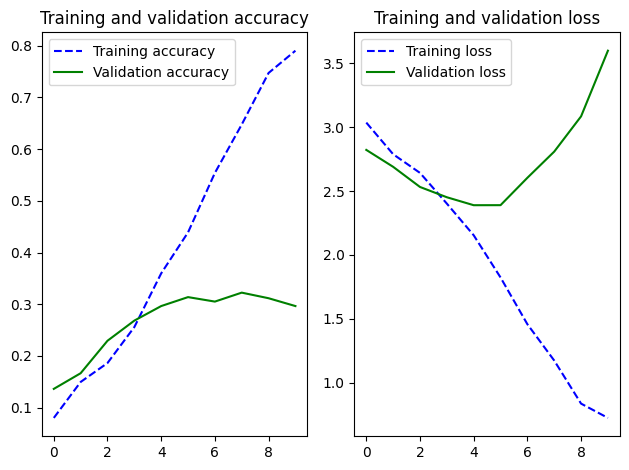

In [53]:
plot_training_analysis(cnn_balanced_history)

In [54]:
test_prediction = cnn_balanced.predict(test_generator)

24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step


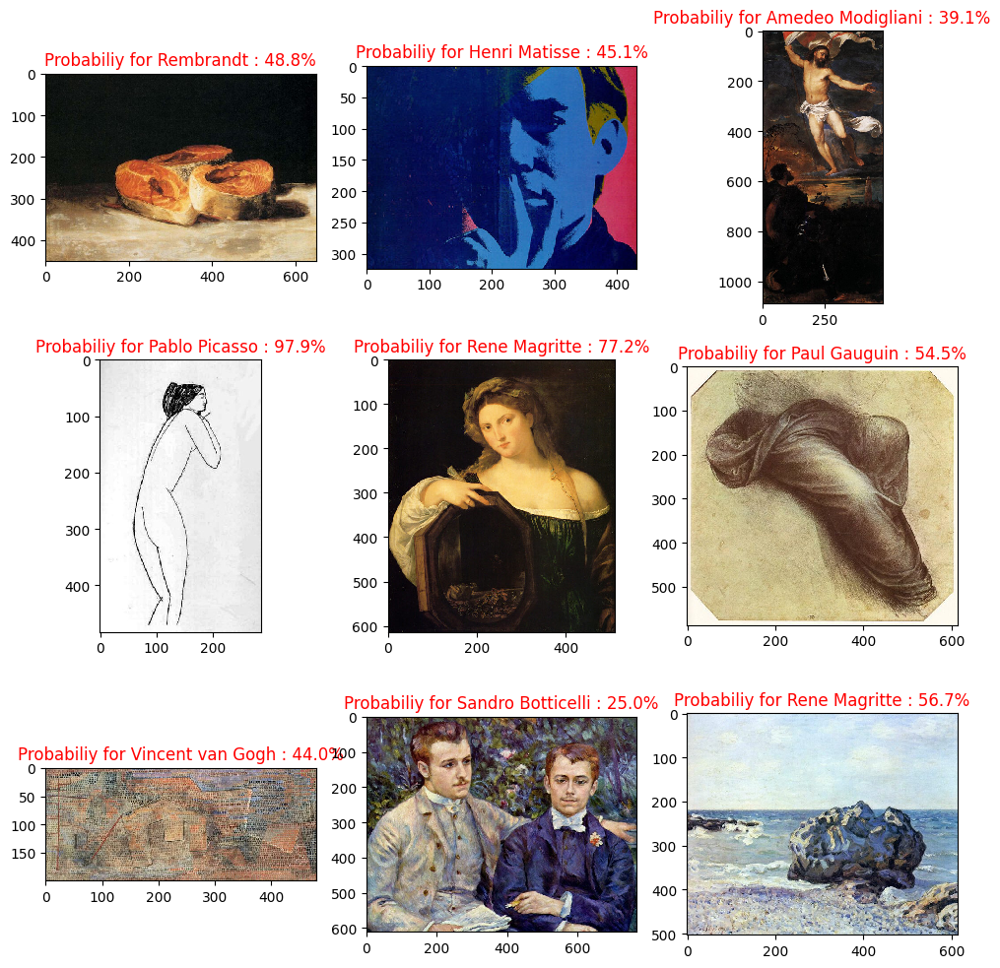

In [55]:
guess_artist(test_prediction)

Le fait d'avoir équilibré le nombre de tableaux par artistes permet de prédir de manière non biaisée. Cependant, l'accuracy de notre modèle ne décolle pas malgré toutes ces considérations. Cela s'explique car notre modèle est trop simple. Il faut donc penser à, soit construire un modèle plus complexe, soit importer un modèle préentrainé. 

# Cinquième approche : utilisation d'un modèle pré-entrainé

Nous avons fait le choix d'importer EfficientNetB6, une architecture de CNN efficace pour les images entre 200x200 et 600x600 pixels. Nous avons choisi d'importer le modèle avec ses poids pré-entrainés sur le dataset imagenet, sans importer le classifier qui va avec. En effet, nous construisons le MLP ayant pour rôle de prédire l'artiste en sortie du modèle. Pour cela, nous avons opté pour une architecture composée de 3 couches cachées comprenant respectivement 512, 256 puis 128 neurones.

In [56]:
model_base = tf.keras.applications.EfficientNetB6(
                include_top=False,
                weights='imagenet'
)

#model_base = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

In [57]:
from tensorflow.keras.layers import GlobalAveragePooling2D, BatchNormalization

#model_base.trainable = False

for layer in model_base.layers[-30:] :
    layer.trainable = True

model = Sequential([
    model_base,  # Modèle base
    GlobalAveragePooling2D(),  # Pour réduire les dimensions spatiales
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(len(label_counts_balanced), activation='softmax')  # Classe de sortie
])


In [58]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb6 (Functional)     │ (None, None, None,     │    40,960,143 │
│                                 │ 2304)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2304)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 23)             │         2,967 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,311,078 (161.40 MB)

 Trainable params: 42,084,847 (160.54 MB)

 Non-trainable params: 226,231 (883.72 KB)

In [59]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.models import load_model

train_model = False

epochs = 50

model.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']) 

if train_model :
    
    early_stopping = EarlyStopping(
    	min_delta = 0,
        monitor='val_accuracy',  # Suivre la validation accuracy
        patience = 5,
    	verbose = 1,
        restore_best_weights=True
    )
    
    t_learning_model = time.time()
    model_history = model.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs,
        callbacks=[early_stopping]
    )

    model.save('model_weights/best_model_earlystopping.h5')
    
    t_learning_model = time.time() - t_learning_model
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_model))
    
    #model.save("model_weights/model.keras")

    with open("model_weights/best_model_history_earlystopping.pkl", "wb") as f:
        pickle.dump(model_history, f)

else :
    # Load the previously saved weights
    #model.load_weights("model_weights/best_model_weights.keras")
    #model = keras.models.load_model('model_weights/best_model_weights.keras')
    #model = load_model('model_weights/best_model_weights.keras')
    #model.load_weights('model_weights/best_model_earlystopping.keras')
    model = load_model('model_weights/best_model_earlystopping.h5')
    
    with open("model_weights/best_model_history_earlystopping.pkl", "rb") as f:
        model_history = pickle.load(f)

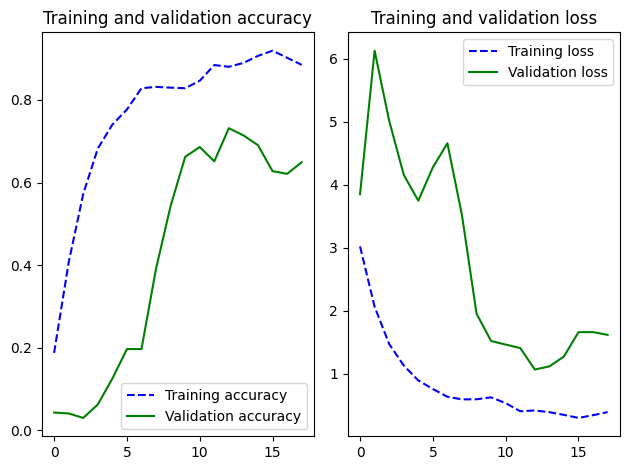

In [60]:
plot_training_analysis(model_history)

In [61]:
t_prediction_model = time.time()

score_cnn_train = model.evaluate(train_generator, verbose=1)
score_cnn_test = model.evaluate(test_generator, verbose=1)
score_cnn_validation = model.evaluate(validation_generator, verbose=1)

t_prediction_model = time.time() - t_prediction_model

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_model )

108/108 ━━━━━━━━━━━━━━━━━━━━ 43s 208ms/step - accuracy: 0.9502 - loss: 0.1527
24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 615ms/step - accuracy: 0.7116 - loss: 1.1779
24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 609ms/step - accuracy: 0.7562 - loss: 0.9825
Train accuracy: 0.9476124048233032
Test accuracy: 0.7213822603225708
Validation accuracy: 0.7316017150878906
Time Prediction: 72.40 seconds


In [62]:
y_true = test_generator.classes  # True labels from test data

24/24 ━━━━━━━━━━━━━━━━━━━━ 31s 746ms/step


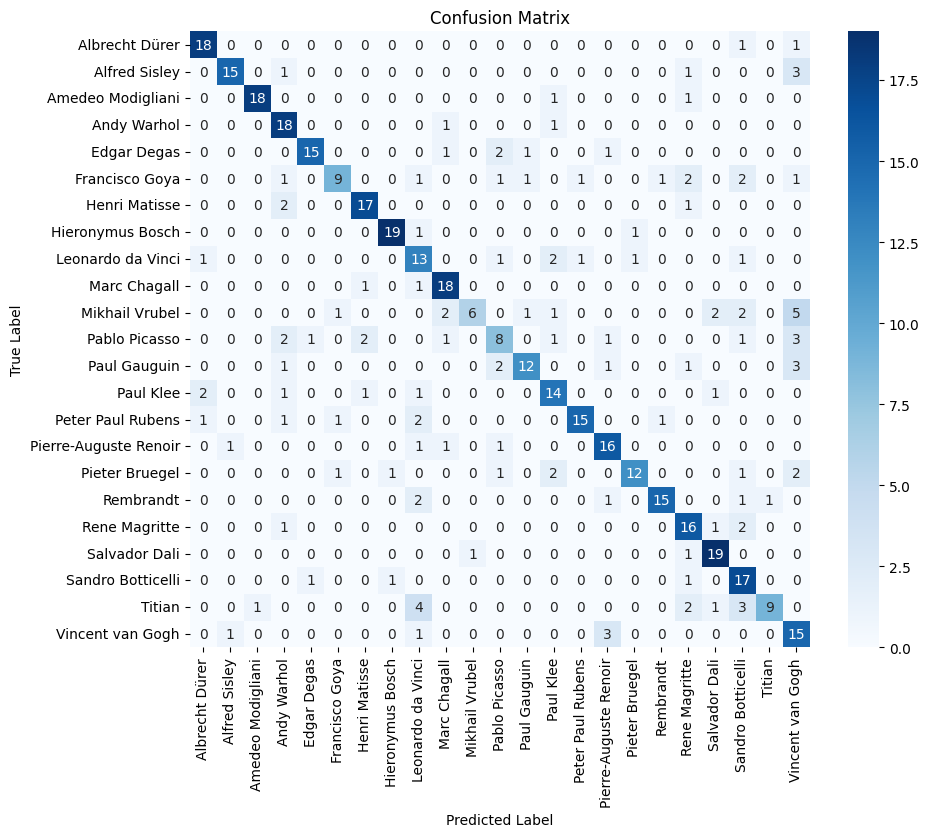

In [63]:
y_pred_prob = model.predict(test_generator)  # Predicted probabilities
y_pred = np.argmax(y_pred_prob, axis=1)

from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


Nous pouvons remarquer que notre modèle apprend très vite, voire trop vite. Ainsi, ses prédictions finales sont satisfaisantes (>70%), mais le modèle est largement overfitté. 

# Sixième approche : introduction de data augmentation

Pour essayer de résoudre l'overfitting de notre modèle précédent, nous pouvons introduire de la data augmentation, afin d'entrainer le tableau sur un maximum de données.

In [64]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Training images with data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,          # Rotation
    width_shift_range=0.2,      # Décalage horizontal
    height_shift_range=0.2,     # Décalage vertical
    shear_range=0.2,            # Cisaillement
    zoom_range=[1.0, 1.5],      # Zoom pour compenser les bordures vides
    horizontal_flip=True,
    fill_mode='nearest'         # Mode de remplissage (utile pour petits ajustements)
)
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    path_images_lq,
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True  # Garder le shuffle activé pour un entraînement plus efficace
)

# Validation images (Pas de data augmentation, juste une normalisation)
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    df_validation,
    path_images_lq,
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False  # Pas de shuffle pour validation
)

# Test images (Pas de data augmentation, juste une normalisation)
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_test,
    path_images_lq,
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False  # Pas de shuffle pour test
)

Found 2157 validated image filenames belonging to 23 classes.
Found 462 validated image filenames belonging to 23 classes.
Found 463 validated image filenames belonging to 23 classes.


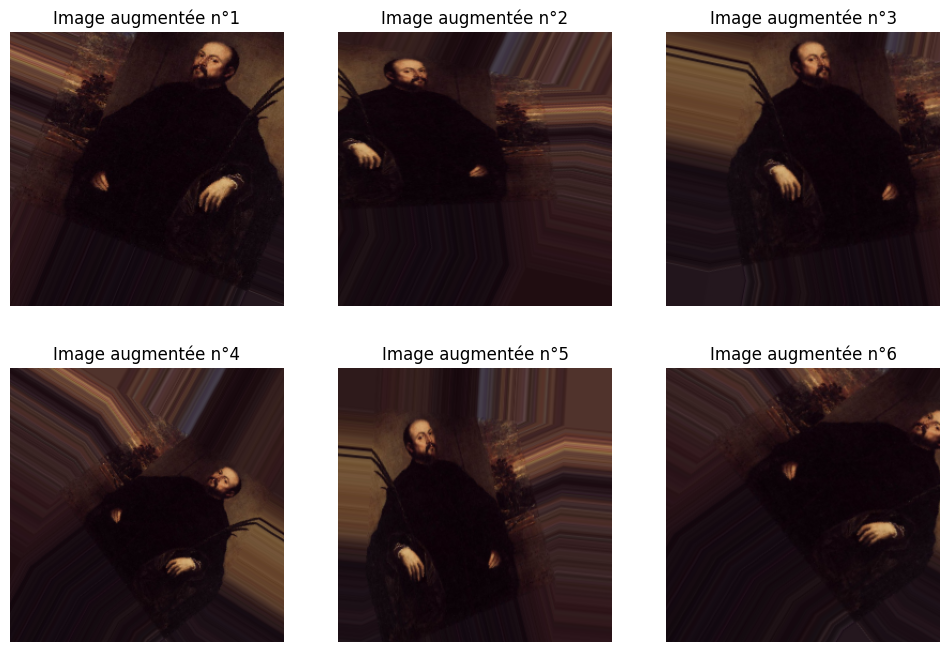

In [65]:
# Charger un lot d'images depuis le générateur
batch = next(train_generator)  # Utiliser la fonction `next()`

# Extraire une image et son label du batch
sample_img = batch[0][0]  # batch[0] contient les images, batch[1] contient les labels

augmented_images = [sample_img]

# Générer des images augmentées
for _ in range(5):  # Créer 5 versions augmentées
    augmented_images.append(train_datagen.random_transform(sample_img))

# Visualiser les images
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
for i, img in enumerate(augmented_images):
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Image augmentée n°{}".format(i + 1))
plt.show()


In [66]:
model_base = tf.keras.applications.EfficientNetB6(
                include_top=False,
                weights='imagenet'
)

for layer in model_base.layers[:] :
    layer.trainable = True

model_DA = Sequential([
    model_base,  # Modèle base
    GlobalAveragePooling2D(),  # Pour réduire les dimensions spatiales
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(len(label_counts_balanced), activation='softmax')  # Classe de sortie
])

In [67]:
train_model_DA = False

epochs = 50

model_DA.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']) 

if train_model_DA :

    early_stopping = EarlyStopping(
    	min_delta = 0,
        monitor='val_accuracy',  # Suivre la validation accuracy
        patience = 5,
    	verbose = 1,
        restore_best_weights=True
    )
    
    t_learning_model = time.time()
    model_DA_history = model_DA.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs,
        callbacks=[early_stopping]
    )
    t_learning_model = time.time() - t_learning_model
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_model))
    
    model_DA.save("model_weights/best_model_DA_weights.h5")

    with open("model_weights/best_model_DA_history.pkl", "wb") as f:
        pickle.dump(model_DA_history, f)

else :
    # Load the previously saved weights
    model_DA.load_weights("model_weights/best_model_DA_weights.h5")
    
    with open("model_weights/best_model_DA_history.pkl", "rb") as f:
        model_DA_history = pickle.load(f)

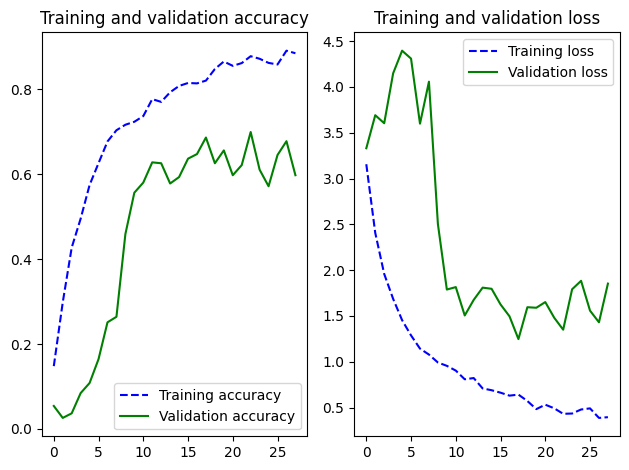

In [68]:
plot_training_analysis(model_DA_history)

In [69]:
t_prediction_model_DA = time.time()

score_cnn_train = model_DA.evaluate(train_generator, verbose=1)
score_cnn_test = model_DA.evaluate(test_generator, verbose=1)
score_cnn_validation = model_DA.evaluate(validation_generator, verbose=1)

t_prediction_model_DA = time.time() - t_prediction_model_DA

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_model_DA )

108/108 ━━━━━━━━━━━━━━━━━━━━ 63s 412ms/step - accuracy: 0.9086 - loss: 0.3019
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 518ms/step - accuracy: 0.6740 - loss: 1.3902
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 507ms/step - accuracy: 0.7266 - loss: 1.2749
Train accuracy: 0.9160871505737305
Test accuracy: 0.6846652030944824
Validation accuracy: 0.6991341710090637
Time Prediction: 88.33 seconds


In [70]:
# Evaluate the model on test data
y_true = test_generator.classes  # True labels from test data
y_pred_prob = model_DA.predict(test_generator)  # Predicted probabilities

24/24 ━━━━━━━━━━━━━━━━━━━━ 33s 768ms/step


In [71]:
y_pred = np.argmax(y_pred_prob, axis=1)

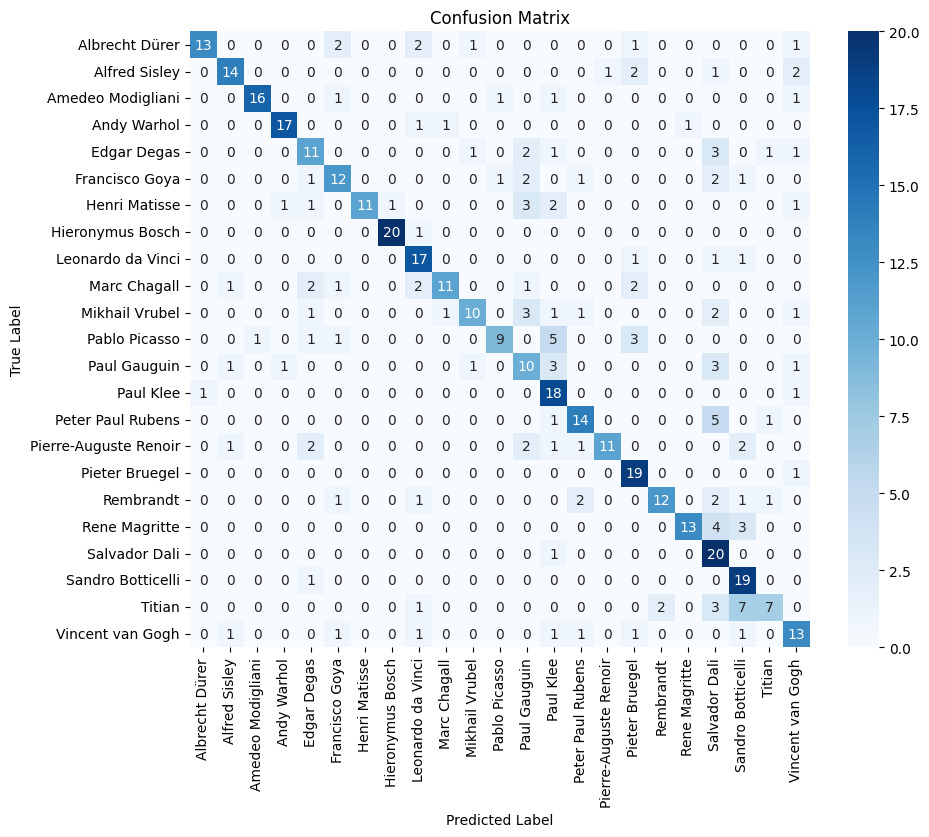

In [72]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


In [73]:
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculate accuracy
accuracy = np.sum(y_true == y_pred) / len(y_true)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 68.47%


Avec de la data augmentation, nous observons le même phénomène : l'accuracy sur le train s'envole et celle sur le validation n'arrive pas à seuivre, même si l'accuracy finale sur le validation set est très bonne. Une dernière idée pour réduire l'overfitting peut être de réduire la taille du classifier en fin de modèle et d'enlever la batch normalization. En effet, nos batchs sont petits (20 images), et la normalisation par batch peut être contre productive pour des petits batchs.

# Septième approche : Réduction de l'overfitting

Dans cette partie, nous allons entrainer un nouveau modèle dans le but de réduire l'overfitting observé sur nos modèles précédents.

In [74]:
model_base = tf.keras.applications.EfficientNetB6(
                include_top=False,
                weights='imagenet'
)

for layer in model_base.layers[:] :
    layer.trainable = True

model_non_overfit = Sequential([
    model_base,  # Modèle base
    GlobalAveragePooling2D(),  # Pour réduire les dimensions spatiales
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(label_counts_balanced), activation='softmax')  # Classe de sortie
])

In [75]:
train_model_non_overfit = False

epochs = 50

model_non_overfit.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']) 

if train_model_non_overfit :

    early_stopping = EarlyStopping(
    	min_delta = 0,
        monitor='val_accuracy',  # Suivre la validation accuracy
        patience = 10,
    	verbose = 1,
        restore_best_weights=True
    )
    
    t_learning_model = time.time()
    model_non_overfit_history = model_non_overfit.fit(
        train_generator,
        validation_data = validation_generator,
        epochs = epochs,
        callbacks=[early_stopping]
    )
    t_learning_model = time.time() - t_learning_model
    
    print("Learning time for %d epochs : %d seconds" % (epochs, t_learning_model))
    
    model_non_overfit.save("model_weights/model_non_overfit_weights.h5")

    with open("model_weights/model_non_overfit_history.pkl", "wb") as f:
        pickle.dump(model_non_overfit_history, f)

else :
    # Load the previously saved weights
    model_non_overfit.load_weights("model_weights/model_non_overfit_weights.h5")
    
    with open("model_weights/model_non_overfit_history.pkl", "rb") as f:
        model_non_overfit_history = pickle.load(f)

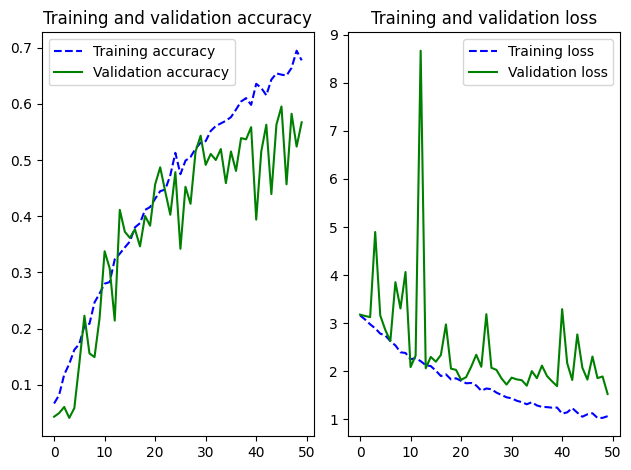

In [76]:
plot_training_analysis(model_non_overfit_history)

In [77]:
t_prediction_model_non_overfit = time.time()

score_cnn_train = model_non_overfit.evaluate(train_generator, verbose=1)
score_cnn_test = model_non_overfit.evaluate(test_generator, verbose=1)
score_cnn_validation = model_non_overfit.evaluate(validation_generator, verbose=1)

t_prediction_model_non_overfit = time.time() - t_prediction_model_non_overfit

print('Train accuracy:', score_cnn_train[1])
print('Test accuracy:', score_cnn_test[1])
print('Validation accuracy:', score_cnn_validation[1])
print("Time Prediction: %.2f seconds" % t_prediction_model_non_overfit)

108/108 ━━━━━━━━━━━━━━━━━━━━ 66s 424ms/step - accuracy: 0.7025 - loss: 1.1377
24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 555ms/step - accuracy: 0.5859 - loss: 1.8161
24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 552ms/step - accuracy: 0.6229 - loss: 1.7849
Train accuracy: 0.6847473382949829
Test accuracy: 0.5809935331344604
Validation accuracy: 0.5952380895614624
Time Prediction: 92.55 seconds


In [78]:
# Evaluate the model on test data
y_true = test_generator.classes  # True labels from test data
y_pred_prob = model_non_overfit.predict(test_generator)  # Predicted probabilities
y_pred = np.argmax(y_pred_prob, axis=1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 33s 774ms/step


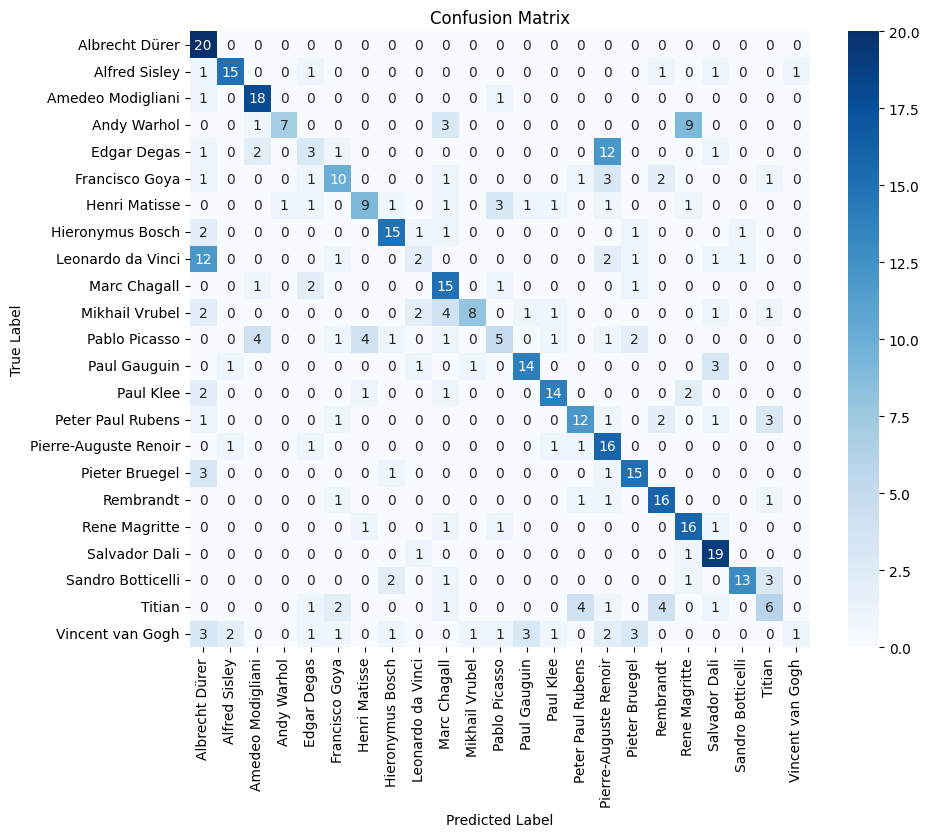

In [79]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


Nos résultats sont concluants : les courbes d'entrainement et de validation de superposent. Cependant, nous avons perdu en accuracy (environ 60% maintenant). Nous devons donc faire un choix entre performances et overfiting. 

# Modèle final : Vote majoritaire

Une dernière possibilité est de combiner nos 3 derniers modèles, et de prédire pour chaque tableau la classe qui a été prédité en majorité par nos modèles. Etant donné que les modèles nous donnentleur pourcentage de confiance sur la prédiction (activation softmax), nous pouvons choisir en cas d'égalité (les 3 modèles votent pour un artiste différent) la réponse du modèle qui donne le plus fort pourcentage sur sa prédiction.

In [80]:
from collections import Counter

probs_model1 = model.predict(test_generator)
probs_model2 = model_DA.predict(test_generator)
probs_model3 = model_non_overfit.predict(test_generator)

y_pred_model1 = np.argmax(probs_model1, axis=1)
y_pred_model2 = np.argmax(probs_model2, axis=1)
y_pred_model3 = np.argmax(probs_model3, axis=1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step


In [81]:
import numpy as np
from collections import Counter

def majority_voting_with_confidence(y_pred_model1, y_pred_model2, y_pred_model3, probs_model1, probs_model2, probs_model3):
    """
    Combine les prédictions de trois modèles avec vote majoritaire.
    En cas d'égalité, la décision est prise en fonction de la confiance.

    Args:
        y_pred_model1, y_pred_model2, y_pred_model3: Prédictions des modèles (indices de classes).
        probs_model1, probs_model2, probs_model3: Probabilités des modèles (valeurs softmax ou similaires).

    Returns:
        list: Classes prédites pour chaque image.
    """
    final_predictions = []

    # Parcourir chaque exemple dans les prédictions
    for i in range(len(y_pred_model1)):
        # Récupérer les prédictions pour l'exemple i
        sample_predictions = [y_pred_model1[i], y_pred_model2[i], y_pred_model3[i]]
        sample_confidences = [probs_model1[i, y_pred_model1[i]], 
                              probs_model2[i, y_pred_model2[i]], 
                              probs_model3[i, y_pred_model3[i]]]

        # Compter les occurrences des prédictions
        prediction_counts = Counter(sample_predictions)

        # Trouver la classe majoritaire
        majority_class, majority_count = prediction_counts.most_common(1)[0]

        if majority_count == 1:  # Tous les modèles prédisent une classe différente
            # En cas d'égalité, choisir la classe du modèle le plus confiant
            most_confident_model = np.argmax(sample_confidences)
            final_predictions.append(sample_predictions[most_confident_model])
        else:
            # Si une majorité existe, utiliser cette classe
            final_predictions.append(majority_class)

    return final_predictions

In [82]:
# Appliquer le vote majoritaire amélioré
final_predictions = majority_voting_with_confidence(
    y_pred_model1, y_pred_model2, y_pred_model3, 
    probs_model1, probs_model2, probs_model3
)

# Afficher les résultats
from sklearn.metrics import accuracy_score

y_true = test_generator.classes  # Les vraies étiquettes du générateur
accuracy = accuracy_score(y_true, final_predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 76.89%


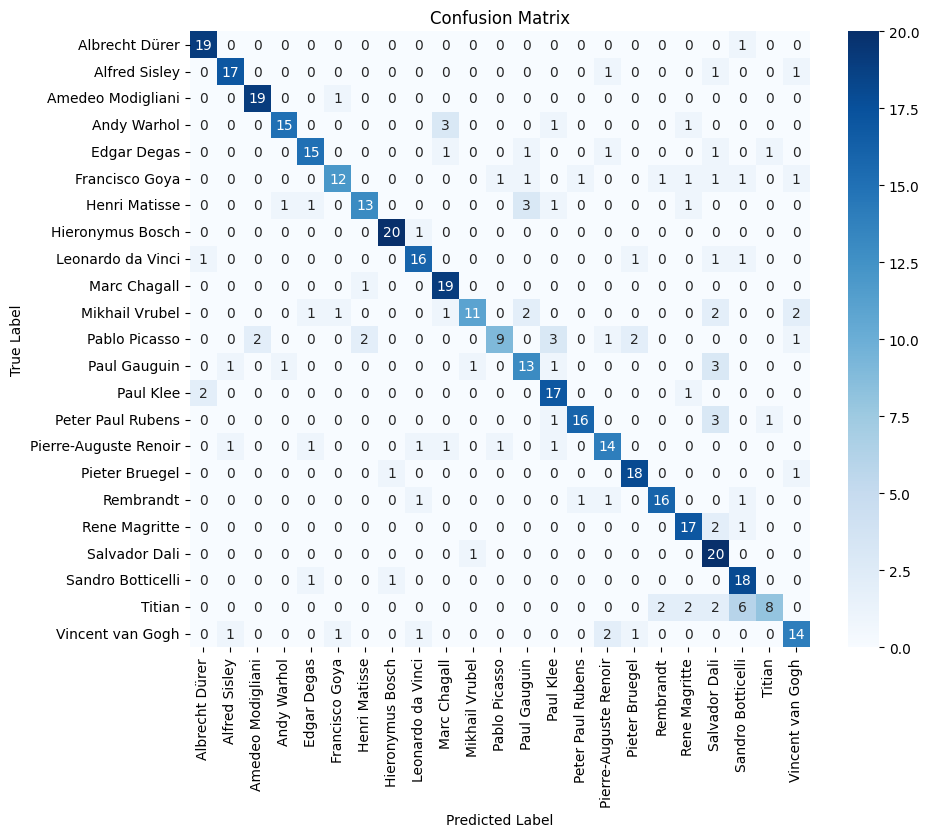

In [83]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, final_predictions)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
print()

Si nous analysons la matrice de confusion finale, nous nous rendons compte que les peintres qui sont confondus sont Titian et Sandro Botticelli, deux peintres de la renaissance italienne. Leur tableaux se ressemblent, et seul un passioné d'art pourrait distinguer leurs oeuvres.

Titian


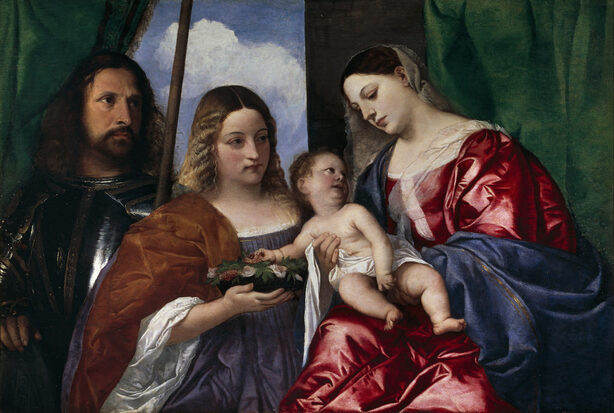

Sandro Botticelli


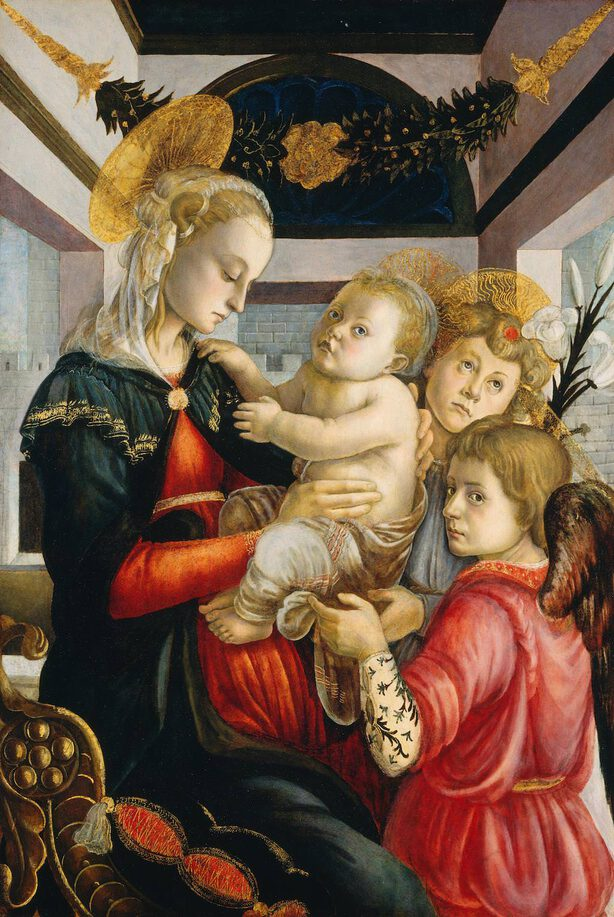

In [95]:
df_titian = df[df['label']=='Titian']
filename = df_titian['filename'].iloc[1]

img = load_img(path_images_lq + filename)

print('Titian')
display(img)

df_titian = df[df['label']=='Sandro Botticelli']
filename = df_titian['filename'].iloc[0]

img = load_img(path_images_lq + filename)

print('Sandro Botticelli')
display(img)

Une dernière idée est de sommer les probabilités en sortie de nos modèles et de prédire l'artiste qui a la plus grande probabilité en moyenne sur les 3 modèle. Cela permet par exemple de moins prendre en compte si un modèle prédit deux artistes avec presque la même proportion.

In [84]:
probs_model = probs_model1 + probs_model2 + probs_model3
y_pred_model = np.argmax(probs_model,axis=1)

In [85]:
# Afficher les résultats
from sklearn.metrics import accuracy_score

y_true = test_generator.classes  # Les vraies étiquettes du générateur
accuracy = accuracy_score(y_true, y_pred_model)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 79.05%


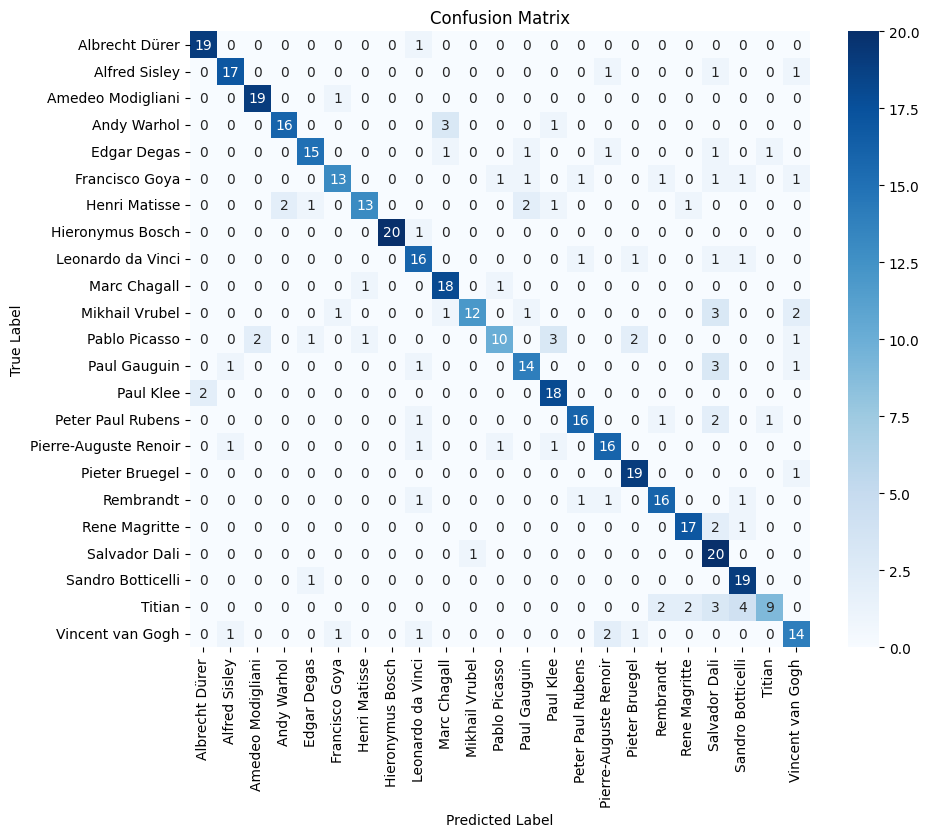

In [86]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_model)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
print()

# Conclusion

Tout au long de ce projet, nous avons détaillé notre démarche afin de construire un réseau performant qui retrouve le peintre d'un tableau. Nous arrivons à une précision de plus de 75%. Notre principal défi fût de combattre l'overfiting, et cela pourrait être encore améliorer en utilisant plus de données. Ainsi, le modèle aurait pu apprendre plus de features importantes chez les artistes, et différencier des artistes proches comme Titian et Botticelli. Nos résultats sont tout de même satisfaisants car ils dépassent les résultats d'un humain lambda.